## EA data subset integration with Braun etal ref data

Aim: >>Integrate Rgl1 and NbDA cell population subsets to Braun et al mid brain reference data
    >> Use latent space to calculate trajectory on integrated object

Run under: seu5_int

In [187]:
#load packages
suppressMessages({
    library(Seurat)
    library(ggplot2)
    library(slingshot)
    library(SingleCellExperiment)
    library(dplyr)
    library(tidyr)
    library(mgcv)
    library(tradeSeq)
    library(grDevices)
    library(RColorBrewer)
})

#easy plot parameter setup function
pdim<-function(x,y){
    return(options(repr.plot.width=x, repr.plot.height=y))
}


In [229]:
braun_ori<-readRDS(".../External_ref/SL_KWL_midbrainRef.rds")

emilia_ori<-readRDS(".../objects/2024Dec_Emilia_BCtracing_merged_clustered_FinalCleaned.rds")

In [3]:
emilia<-subset(emilia_ori, subset = Celltype_refine_group %in% c("hRgl1", "NbDA"))

braun_ori@meta.data$Data<-"Braun"
emilia@meta.data$Data<-"Emilia"

In [4]:
braun_ori[["RNA"]] <- as(braun_ori[["RNA"]], "Assay")
emilia[["RNA"]] <- as(emilia[["RNA"]], "Assay")

DefaultAssay(braun_ori)<-"RNA"
DefaultAssay(emilia)<-"RNA"

seurat_list<-list(braun_ori, emilia)
names(seurat_list)<-c("braun", "emilia")

$braun

$emilia


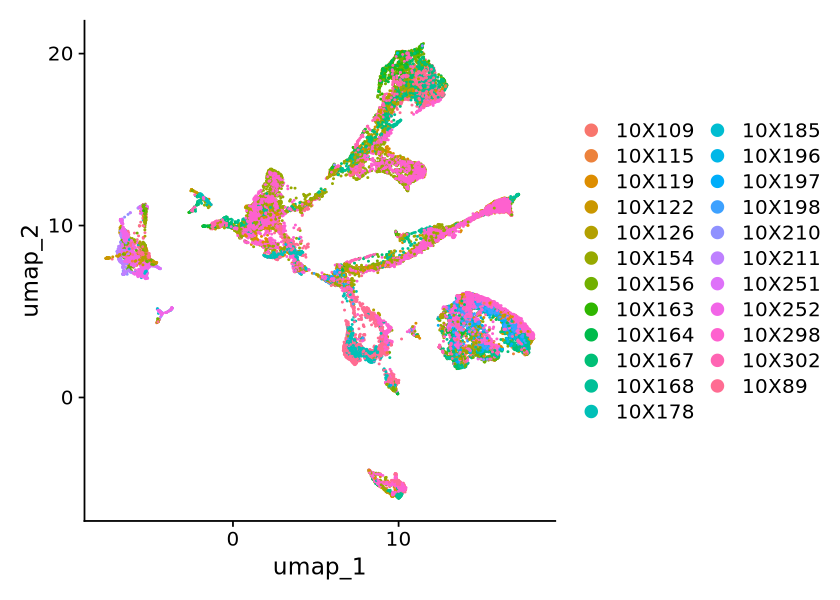

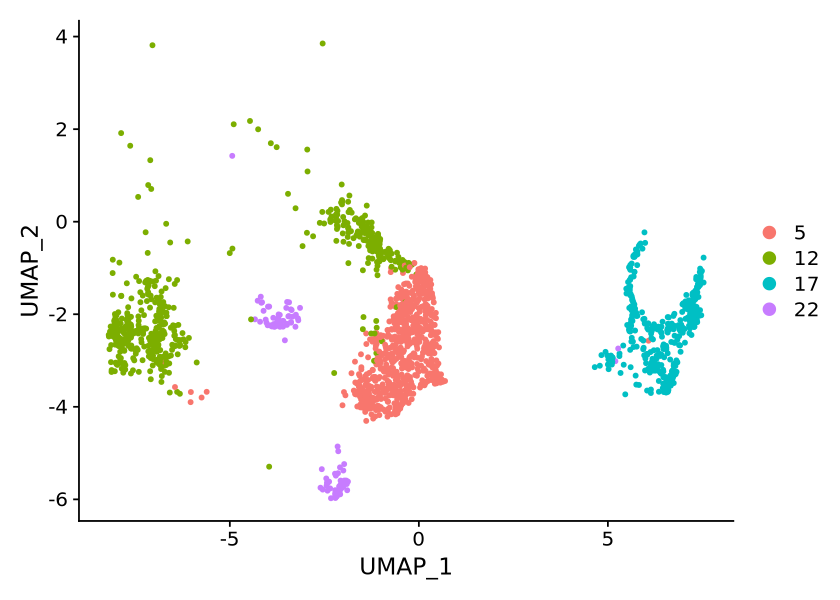

In [5]:
pdim(7,5)
lapply(seurat_list, DimPlot)

## 2) Preprocess each batch with SCTransform

In [25]:
for (i in seq_along(seurat_list)) {
  so <- seurat_list[[i]]
  so <- SCTransform(so, #variable.features.n = 1000,
                    verbose = FALSE) %>%
        RunPCA(.)
  seurat_list[[i]] <- so
}

PC_ 1 
Positive:  TMSB10, STMN2, TUBA1A, STMN1, TUBB3, TMSB4X, GAP43, TUBB, SOX4, CRABP1 
	   MLLT11, PTMA, ROBO1, CACNA2D1, NRG1, NNAT, ACTB, NEFL, EBF1, CNTNAP2 
	   ANK3, RTN1, TENM2, FAM155A, ADARB2, MEG3, TUBB2B, INA, KLHL1, NEFM 
Negative:  TTYH1, NTRK2, BCAN, SPARCL1, CLU, CST3, ID4, QKI, FABP7, PTN 
	   C1orf61, GPM6B, SLC1A3, VIM, CFAP299, C9orf24, NTN1, METRN, PARD3B, SPON1 
	   APOE, CD81, NFIA, PTPRZ1, GLIS3, EEPD1, ADGRV1, NFIB, PACRG, SULF1 
PC_ 2 
Positive:  NRXN3, RBFOX1, STMN2, CSMD1, ADARB2, NTRK2, SPARCL1, NRG3, TUBA1A, GPC5 
	   CCSER1, NRG1, NRXN1, SNTG1, ROBO1, FAM155A, CTNNA2, PCDH9, ANK3, CST3 
	   DSCAM, DPP6, PBX1, RTN1, BCAN, LSAMP, TENM2, CNTNAP2, NAV3, TUBB3 
Negative:  UBE2C, HMGB2, TOP2A, VIM, PTTG1, CENPF, CCNB1, CDK1, CKS2, CCN2 
	   CDC20, HES1, SLIT2, BIRC5, KPNA2, CCNB2, ID3, MAD2L1, H2AZ1, TUBA1B 
	   HMGB1, PBK, RPS2, CKS1B, RPL7, CCNA2, RPL13A, NUF2, RPS6, MIR924HG 
PC_ 3 
Positive:  CRABP1, CST3, RPL10, RPL34, GADD45G, IGFBPL1, RPS27, ROBO3, NEFL

## 3) run integration

In [73]:
features <- SelectIntegrationFeatures(object.list = seurat_list, nfeatures = 1000)
seurat_list <- PrepSCTIntegration(object.list = seurat_list, anchor.features = features)
anchors <- FindIntegrationAnchors(object.list = seurat_list, 
                                  dims = 1:20, #20
                                  normalization.method = "SCT", 
                                  #reference = 1, #previously silenced
                                  anchor.features = features, 
                                  reduction = "rpca")
seurat_integrated <- IntegrateData(anchorset = anchors, 
                                   dims = 1:20, #20
                                   normalization.method = "SCT")

Computing within dataset neighborhoods

Finding all pairwise anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 374 anchors



[1] 1


Warning message:
“Different cells and/or features from existing assay SCT”
Warning message:
“Layer counts isn't present in the assay object; returning NULL”


[1] 2


Warning message:
“Different cells and/or features from existing assay SCT”
Warning message:
“Layer counts isn't present in the assay object; returning NULL”
Merging dataset 2 into 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Warning message:
“Layer counts isn't present in the assay object; returning NULL”
Warning message:
“Assay integrated changing from Assay to SCTAssay”
Warning message:
“Layer counts isn't present in the assay object; returning NULL”
Warning message:
“Different cells and/or features from existing assay SCT”


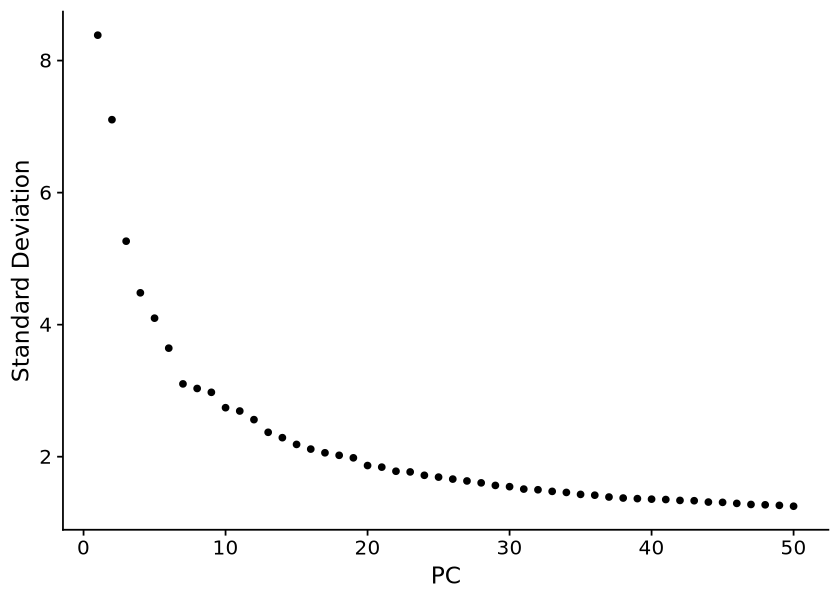

In [74]:
DefaultAssay(seurat_integrated) <- "integrated"
seurat_integrated <- ScaleData(seurat_integrated, verbose = FALSE)
seurat_integrated <- RunPCA(seurat_integrated, npcs = 50, verbose = FALSE)

ElbowPlot(seurat_integrated, ndims = 50)

In [89]:
seurat_integrated <- RunUMAP(seurat_integrated, reduction = "pca", dims = 1:30, verbose = FALSE)
seurat_integrated <- FindNeighbors(seurat_integrated, reduction = "pca", dims = 1:30)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 33966
Number of edges: 1223750

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9484
Number of communities: 22
Elapsed time: 4 seconds


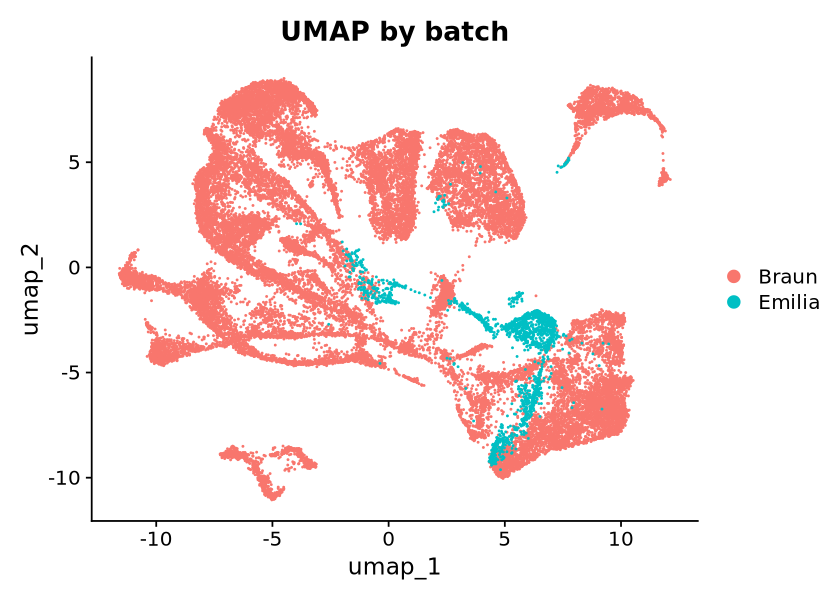

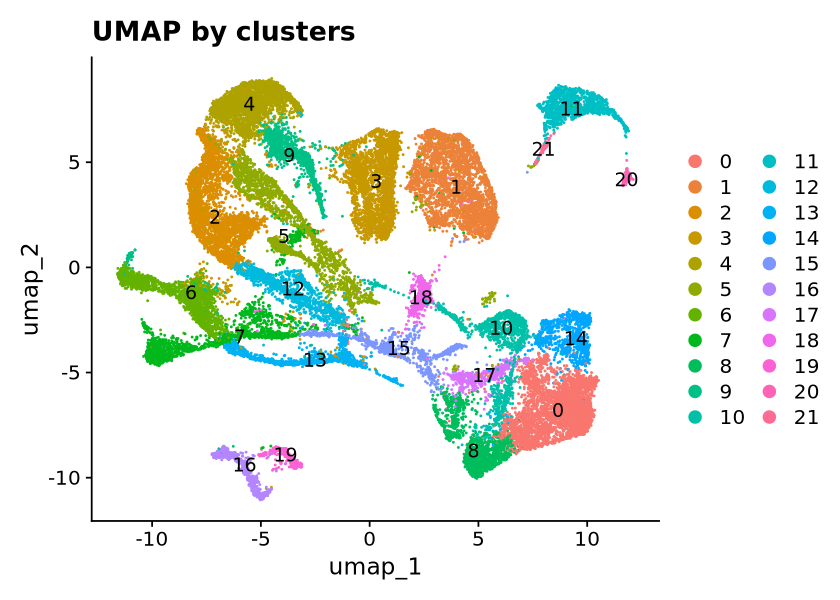

In [91]:
# Visual QC plots
DimPlot(seurat_integrated, reduction = "umap", group.by = "Data") + ggtitle("UMAP by batch")
DimPlot(seurat_integrated, reduction = "umap", label = TRUE) + ggtitle("UMAP by clusters")

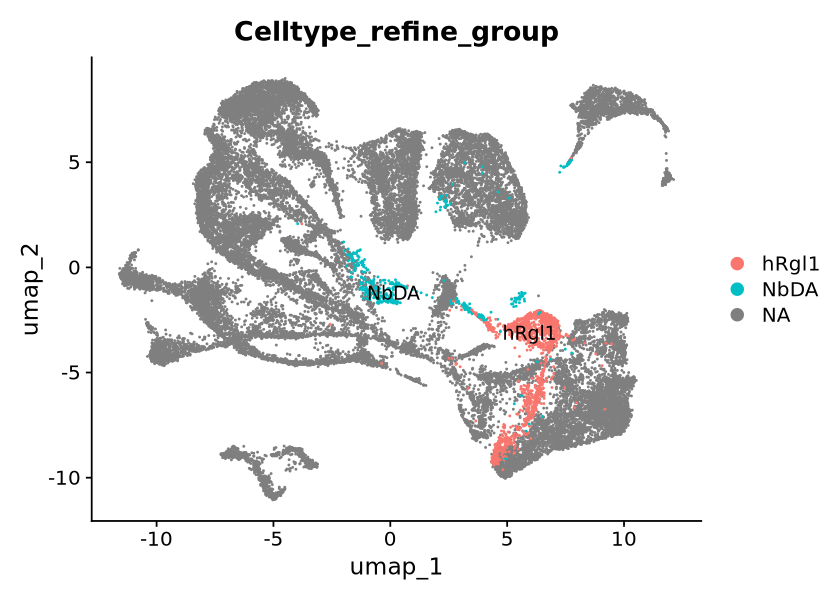

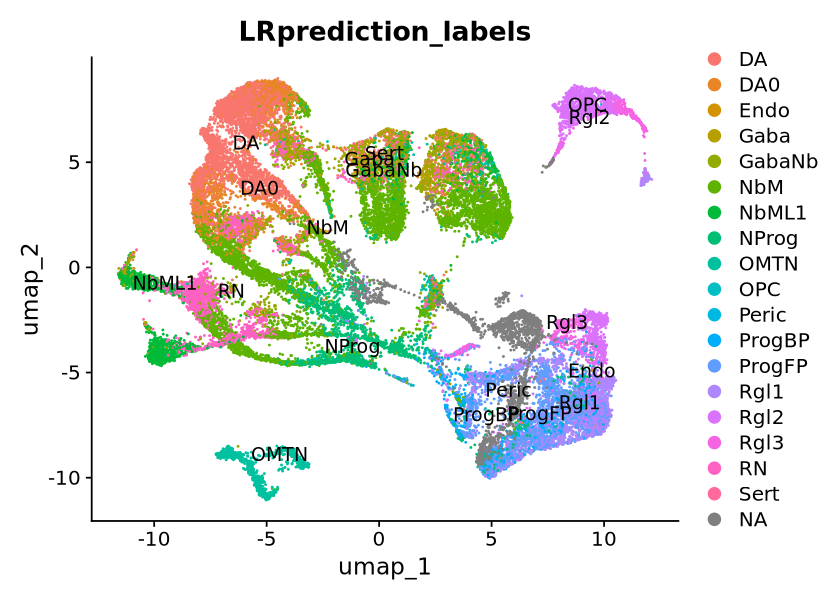

In [92]:
DimPlot(seurat_integrated, group.by = "Celltype_refine_group", reduction = "umap", label = TRUE)
DimPlot(seurat_integrated, group.by = "LRprediction_labels", reduction = "umap", label = TRUE)

## Prepare slingshot

In [129]:
unique(seurat_integrated@meta.data$Data)
seurat_integrated

[1] "Braun"  "Emilia"

An object of class Seurat 
113097 features across 33966 samples within 3 assays 
Active assay: integrated (1000 features, 1000 variable features)
 2 layers present: data, scale.data
 2 other assays present: RNA, SCT
 2 dimensional reductions calculated: pca, umap

In [104]:
# prepare clean celltype identity column
seurat_integrated@meta.data$Int_celltype<-paste0(ifelse(is.na(seurat_integrated$Celltype_refine_group),"", seurat_integrated$Celltype_refine_group), 
                                                ifelse(is.na(seurat_integrated$LRprediction_labels), "",seurat_integrated$LRprediction_labels)
                                                 )

In [105]:
seurat_integrated$Int_celltype<-paste(seurat_integrated$Data, seurat_integrated$Int_celltype, 
                                      sep = "_")

unique(seurat_integrated$Int_celltype)

[1] "Braun_RN"     "Braun_NbM"    "Braun_GabaNb" "Braun_DA"     "Braun_Gaba"  
 [6] "Braun_OMTN"   "Braun_DA0"    "Braun_ProgFP" "Braun_Sert"   "Braun_NbML1" 
[11] "Braun_NProg"  "Braun_Rgl1"   "Braun_ProgBP" "Braun_Rgl2"   "Braun_OPC"   
[16] "Braun_Rgl3"   "Braun_Peric"  "Braun_Endo"   "Emilia_hRgl1" "Emilia_NbDA"

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 33966
Number of edges: 1223750

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9269
Number of communities: 31
Elapsed time: 4 seconds


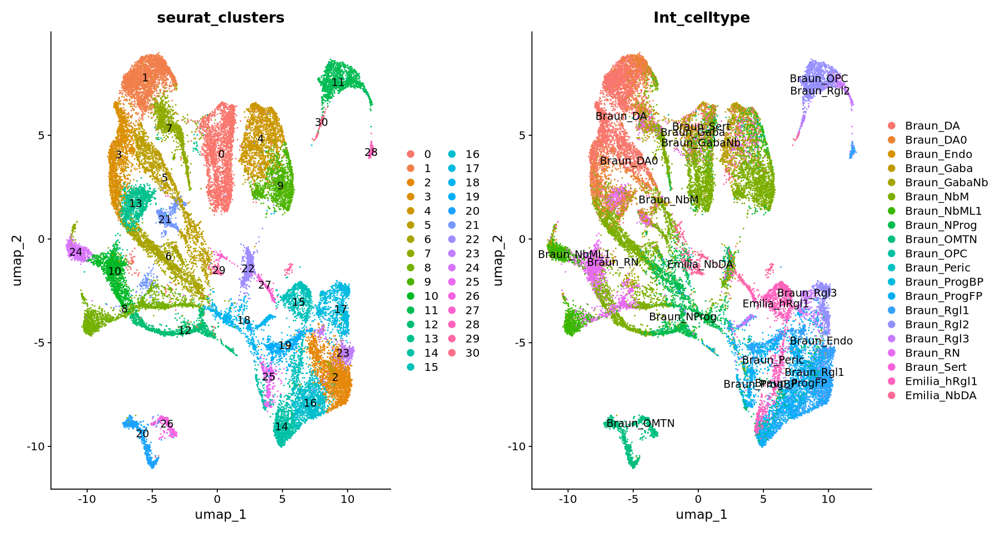

In [107]:
#ensure good seperation of DA subpopulations over clustering on integrated object
seurat_integrated <- FindClusters(seurat_integrated, resolution = 0.8)

pdim(15,8)
DimPlot(seurat_integrated, group.by = c("seurat_clusters", "Int_celltype"), 
        ncol = 2, 
        reduction = "umap", label = TRUE)

In [179]:
pca_embedding <- Embeddings(seurat_integrated, reduction = "pca")[, 1:30]
umap_embedding <- Embeddings(seurat_integrated, reduction = "umap")[,1:2]
cluster_labels <- Idents(seurat_integrated)

#prepare single cell exp object
sce <- SingleCellExperiment(assays = list(logcounts = as.matrix(GetAssayData(seurat_integrated, slot = "data"))))
reducedDims(sce) <- SimpleList(PCA = pca_embedding, UMAP = umap_embedding)
colData(sce)$cluster <- as.character(cluster_labels)
colData(sce)$Data <- seurat_integrated$Data
colData(sce)$Celltype <- as.character(seurat_integrated$Int_celltype)

## Run Slingshot with only  Rgl1 to DA lineage

An object of class Seurat 
113097 features across 22414 samples within 3 assays 
Active assay: integrated (1000 features, 1000 variable features)
 2 layers present: data, scale.data
 2 other assays present: RNA, SCT
 2 dimensional reductions calculated: pca, umap

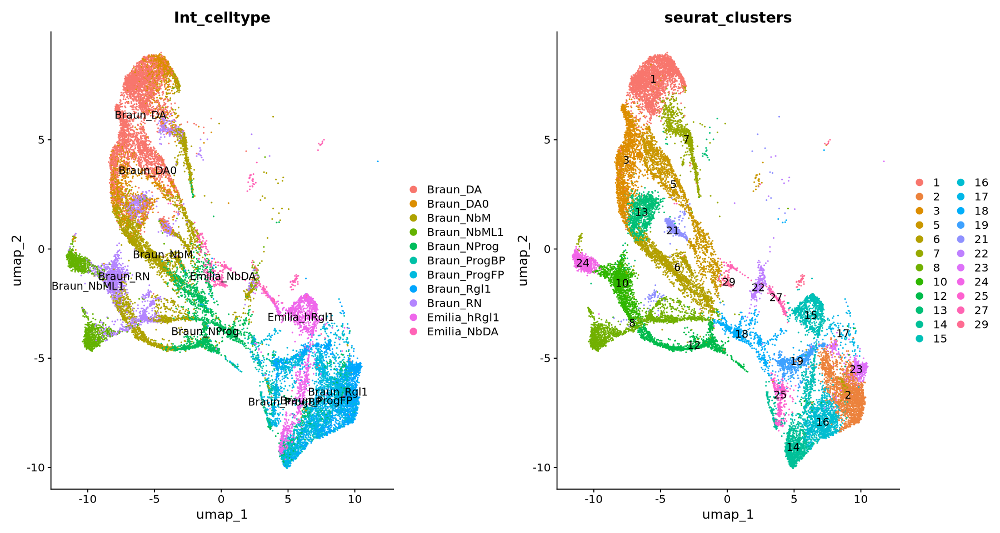

In [207]:
seu_sub<-subset(seurat_integrated, subset = Int_celltype %in% c(paste0("Braun_" , c("DA", "DA0", "NbM", "NbML1",
                                                                                        "NProg", "ProgBP", "ProgFP", "Rgl1","RN")),
                                                                    "Emilia_hRgl1", "Emilia_NbDA")
                )

#remove cell population that is known not relevant for Rgl1 to DA (ref Braun et al velocity analysis)
#remove clusters containing only 1 cell to ensure slingshot analysis
seu_sub<-subset(seu_sub, subset = seurat_clusters %in% c(0, 4, 9, 11, 28, 30,
                                                        #1 cell clusters
                                                        20,26), invert = TRUE)

seu_sub

DimPlot(seu_sub, group.by = c("Int_celltype", "seurat_clusters"), label = TRUE)

In [208]:
table(seu_sub@meta.data$seurat_clusters)


   1    2    3    5    6    7    8   10   12   13   14   15   16   17   18   19 
2698 1892 1841 1538 1516  909 1431 1322 1127  998 1080 1110 1092  110  568  658 
  21   22   23   24   25   27   29 
 401  271  609  543  343  225  132 

In [209]:
pca_embedding <- Embeddings(seu_sub, reduction = "pca")[, 1:30]
umap_embedding <- Embeddings(seu_sub, reduction = "umap")[,1:2]
cluster_labels <- Idents(seu_sub)

#prepare single cell exp object
sce_sub <- SingleCellExperiment(assays = list(logcounts = as.matrix(GetAssayData(seu_sub, slot = "data"))))
reducedDims(sce_sub) <- SimpleList(PCA = pca_embedding, UMAP = umap_embedding)
colData(sce_sub)$cluster <- as.character(cluster_labels)
colData(sce_sub)$Data <- seu_sub$Data
colData(sce_sub)$Celltype <- as.character(seu_sub$Int_celltype)

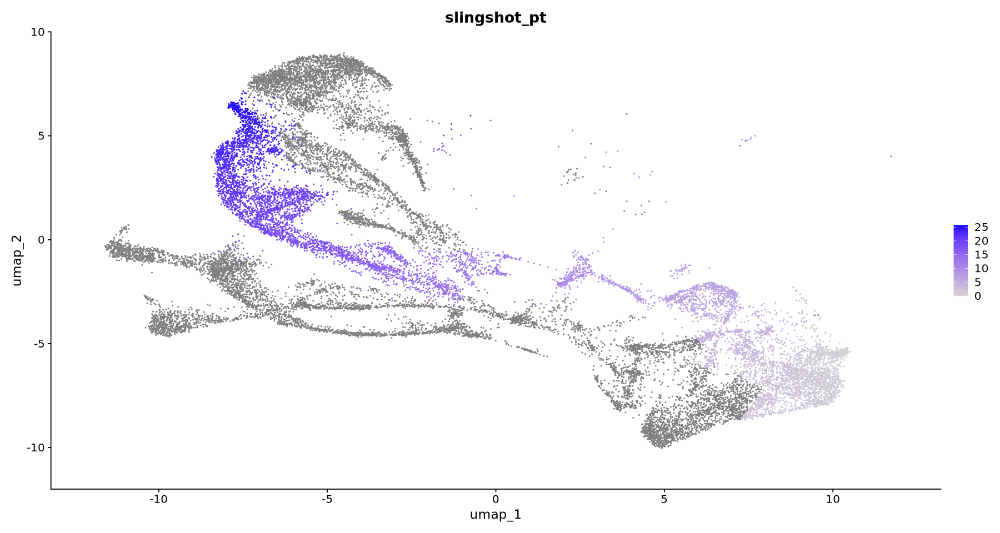

In [227]:
sling_sub <- slingshot(sce_sub, clusterLabels = 'cluster',
                        start.clus = c(2,14,15,16,23,19, 25), # define known starting progenitor clusters
                       omega = 0,
                        reducedDim = 'UMAP')
pseudotime_pt <- slingPseudotime(sling_sub)[,3]
seu_sub$slingshot_pt <- pseudotime_pt
FeaturePlot(seu_sub, features = "slingshot_pt", reduction = "umap")

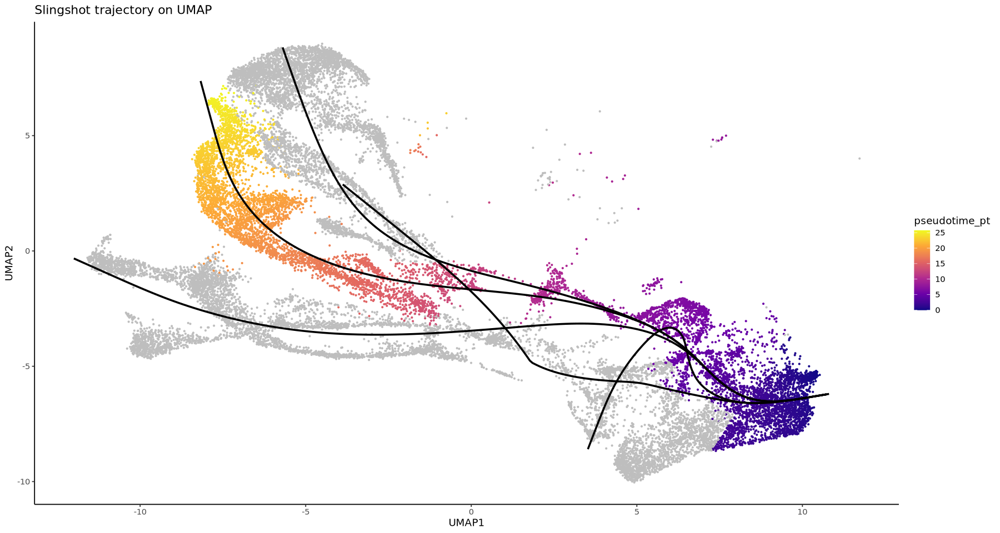

In [228]:
# ---------------------------
# 8) Visualise trajectory lineage on UMAP
# ---------------------------
# Extract UMAP coordinates
umap_coords <- Embeddings(seu_sub, "umap")

# Slingshot curves are in reducedDims(sling)
lineages <- slingCurves(sling_sub)

# Plot cells colored by pseudotime with curves overlayed
umap_df <- data.frame(UMAP1 = umap_coords[,1], UMAP2 = umap_coords[,2], 
                      pseudotime = pseudotime_pt, celltype = seu_sub$Int_celltype)

p_traj <- ggplot(umap_df, aes(x = UMAP1, y = UMAP2, color = pseudotime_pt)) +
  geom_point(size = 0.5) +
  scale_color_viridis_c(option = "plasma", na.value = "grey") +
  theme_classic() +
  ggtitle("Slingshot trajectory on UMAP")

# Add curves to the plot
for (lineage in names(lineages)) {
  curve_df <- as.data.frame(lineages[[lineage]]$s)
  colnames(curve_df) <- c("UMAP1", "UMAP2")
  p_traj <- p_traj + geom_path(data = curve_df, aes(x = UMAP1, y = UMAP2), color = "black", size = 1)
}

print(p_traj)

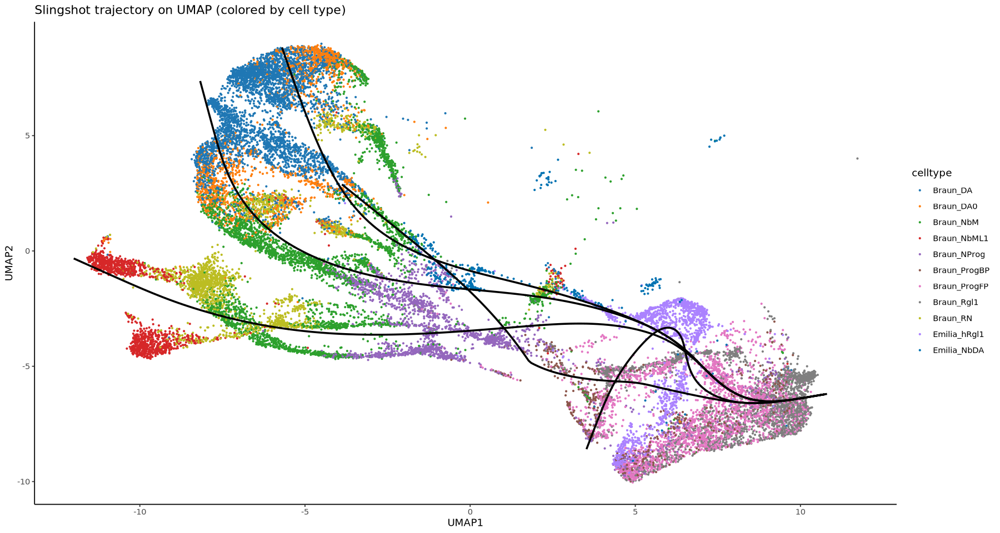

In [248]:
# Vector of 11 distinct colors
color_vector <- c(
  "#1f77b4",  # blue
  "#ff7f0e",  # orange
  "#2ca02c",  # green
  "#d62728",  # red
  "#9467bd",  # purple
  "#8c564b",  # brown
  "#e377c2",  # pink
  "#7f7f7f",  # gray
  "#bcbd22",  # yellow-green
  "#AB82FF",  # chnaged purple
  "#0072B2"   # changhed navy blue
)


# Plot cells colored by cell type
p_traj <- ggplot(umap_df, aes(x = UMAP1, y = UMAP2, color = celltype)) +
  geom_point(size = 0.5) +
  theme_classic() +
  ggtitle("Slingshot trajectory on UMAP (colored by cell type)") +
  scale_color_manual(values = color_vector)  # Optional: define custom colors
# Add curves to the plot
for (lineage in names(lineages)) {
  curve_df <- as.data.frame(lineages[[lineage]]$s)
  colnames(curve_df) <- c("UMAP1", "UMAP2")
  p_traj <- p_traj + geom_path(data = curve_df, aes(x = UMAP1, y = UMAP2), color = "black", size = 1)
}

pdim(15,8)
print(p_traj)


# Visualisation

Current analysis picked up all major trajectories as expected
Export plots for revision and supp figures

In [260]:
output_dir<-".../Output/2nd_Rev_Integration/"

In [242]:
#demonstrate cells that were included for integration into Braun etal

p1_emilia_highlight <- DimPlot(emilia_ori, reduction = "umap", 
                               pt.size = 0.5, 
                               cells.highlight = list(rownames(emilia_ori@meta.data)[emilia_ori@meta.data$Celltype_refine_group %in% c("hRgl1", "NbDA")]))+ 
                        scale_color_manual(labels = c("Other cell types", "Intgrated cells"), values = c("grey", "darkblue")) +
                        ggtitle("Cells used for integration from EA data")

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


In [237]:
# show integrated object UMAP and cells used for integration

p2_intobj_emilia<- DimPlot(seurat_integrated, group.by = "Celltype_refine_group", reduction = "umap", 
                           cols = c("#AB82FF", "#0072B2"),
                           label = TRUE) + ggtitle("Integrated cell population highlight from EA data")
p3_intobj_braun<- DimPlot(seurat_integrated, group.by = "LRprediction_labels", 
                          reduction = "umap", label = TRUE) + ggtitle("Integrated cell population highlight from Braun data")

In [250]:
#highlight cells that were took for trajectory analysis

list_cells<-list(rownames(seu_sub@meta.data))

p4_traj_cell<-DimPlot(seurat_integrated, reduction = "umap", pt.size = 0.5,
                     cells.highlight = list_cells)+
                scale_color_manual(labels = c("Other cells", "Trajectory calculation"),
                                  values = c("grey", "#8da0cb"))+
                ggtitle("cells for trajectory analysis")

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


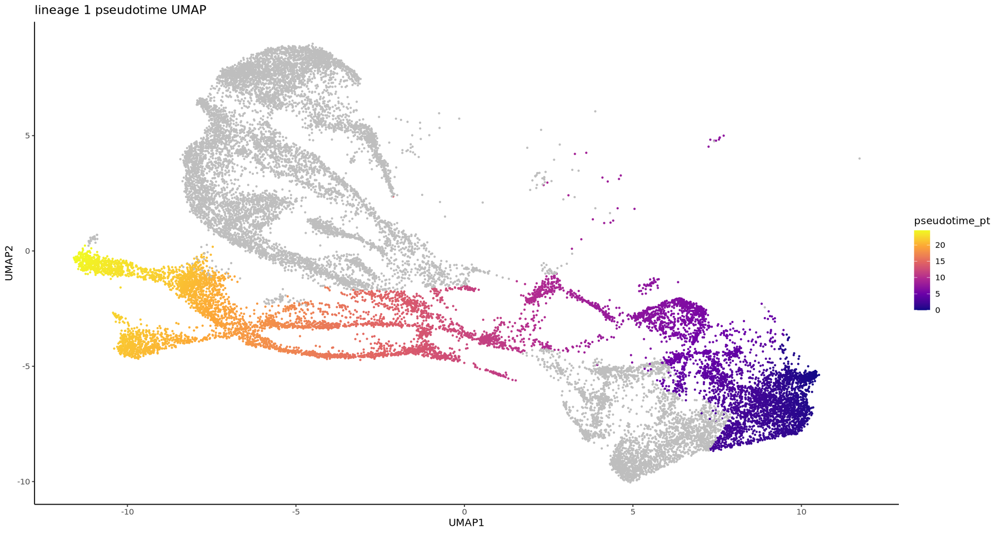

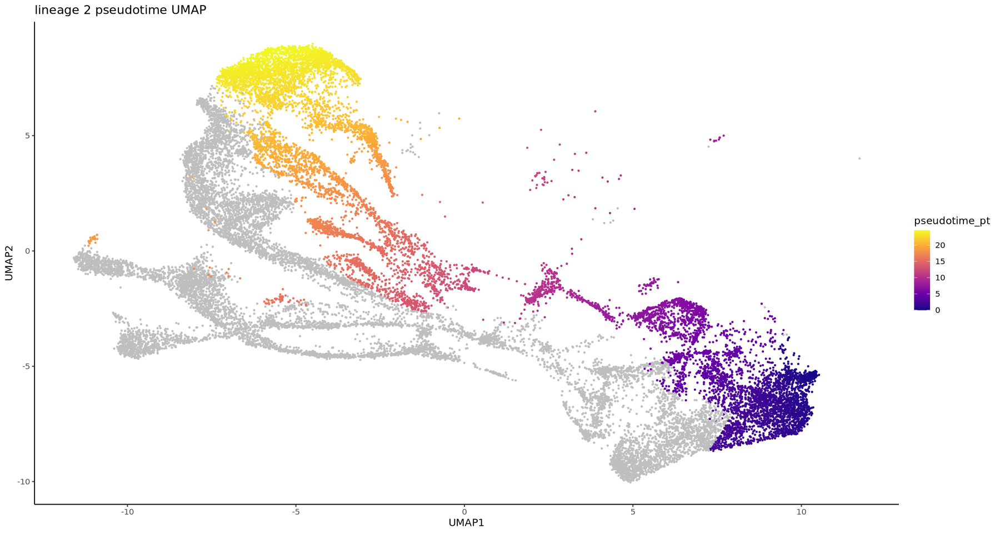

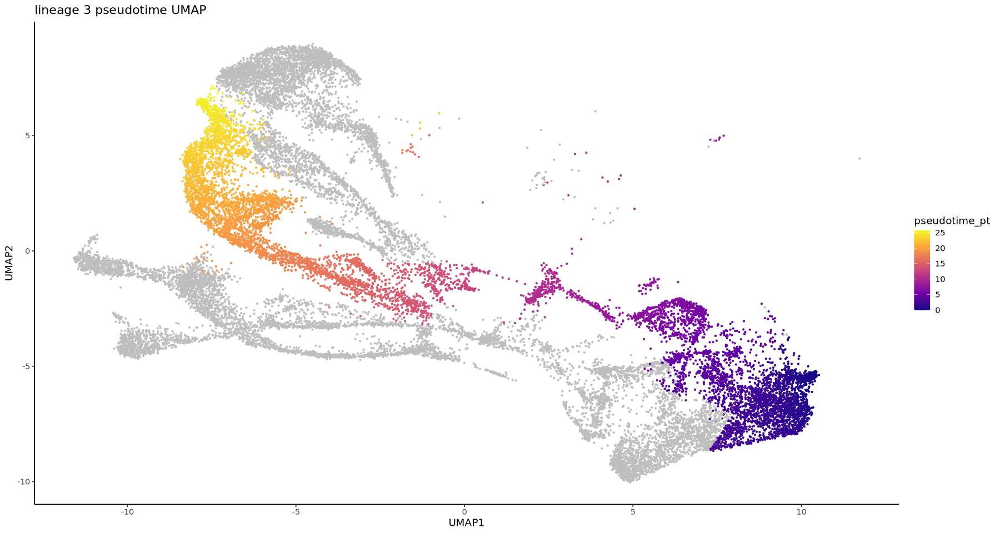

In [256]:
#main trtajectories pseudotime value highlight

pseudo_highlight<-function(traj){
    pseudotime_pt <- slingPseudotime(sling_sub)[,traj]
    seu_sub$slingshot_pt <- pseudotime_pt
    umap_coords <- Embeddings(seu_sub, "umap")

    # Slingshot curves are in reducedDims(sling)
    lineages <- slingCurves(sling_sub)
    
    # Plot cells colored by pseudotime with curves overlayed
    umap_df <- data.frame(UMAP1 = umap_coords[,1], UMAP2 = umap_coords[,2], 
                          pseudotime = pseudotime_pt, celltype = seu_sub$Int_celltype)
    
    p_tmp <- ggplot(umap_df, aes(x = UMAP1, y = UMAP2, color = pseudotime_pt)) +
      geom_point(size = 0.5) +
      scale_color_viridis_c(option = "plasma", na.value = "grey") +
      theme_classic() +
      ggtitle(paste0("lineage ", traj, " pseudotime UMAP"))
    
    return(p_tmp)
}

for(i in 1:3){
    plot<-pseudo_highlight(traj = i)

    print(plot)
}

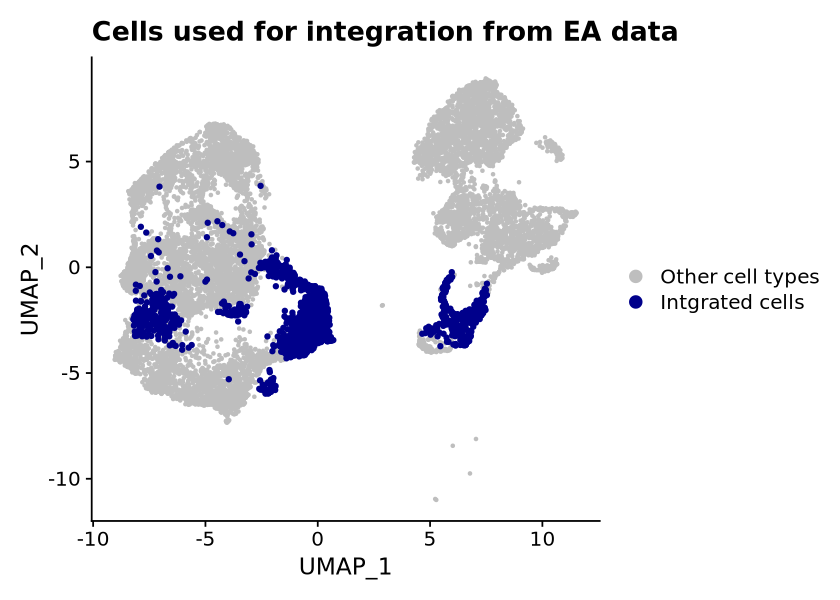

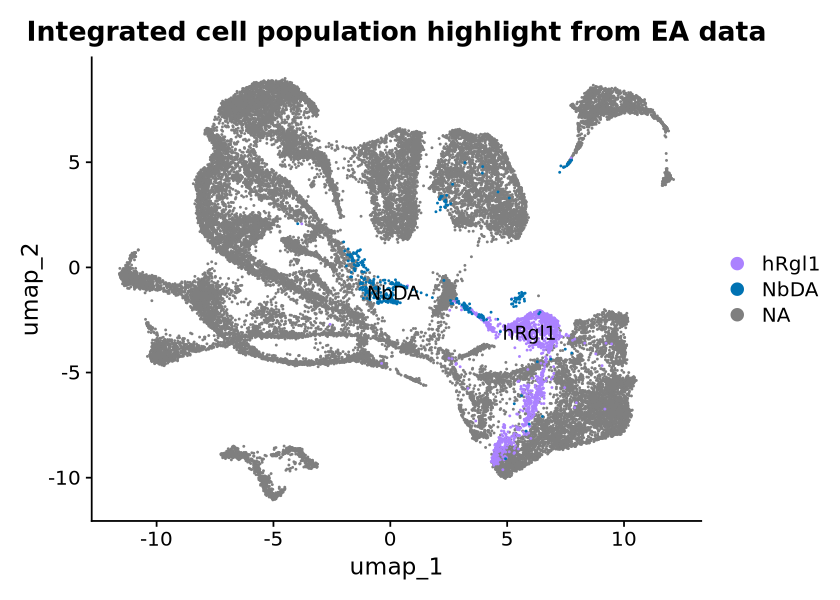

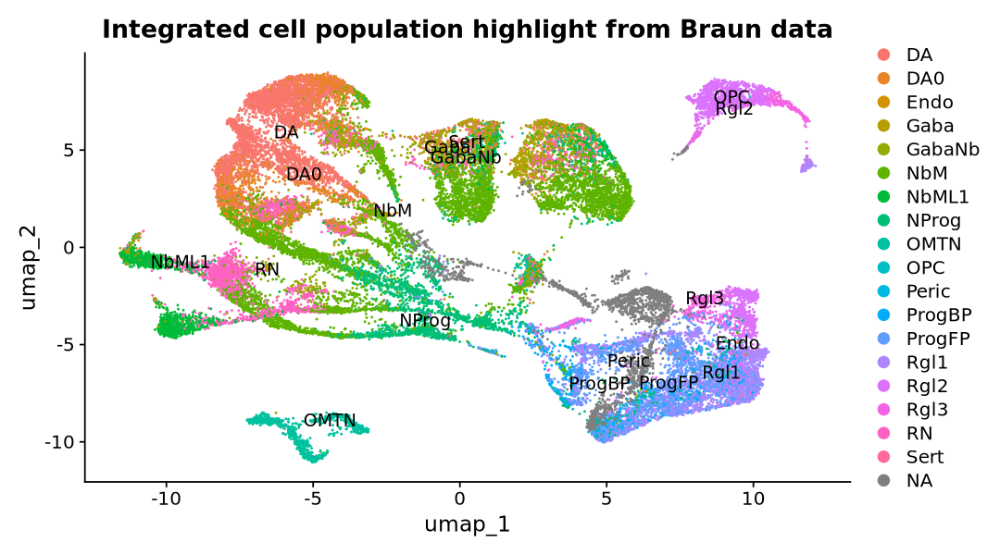

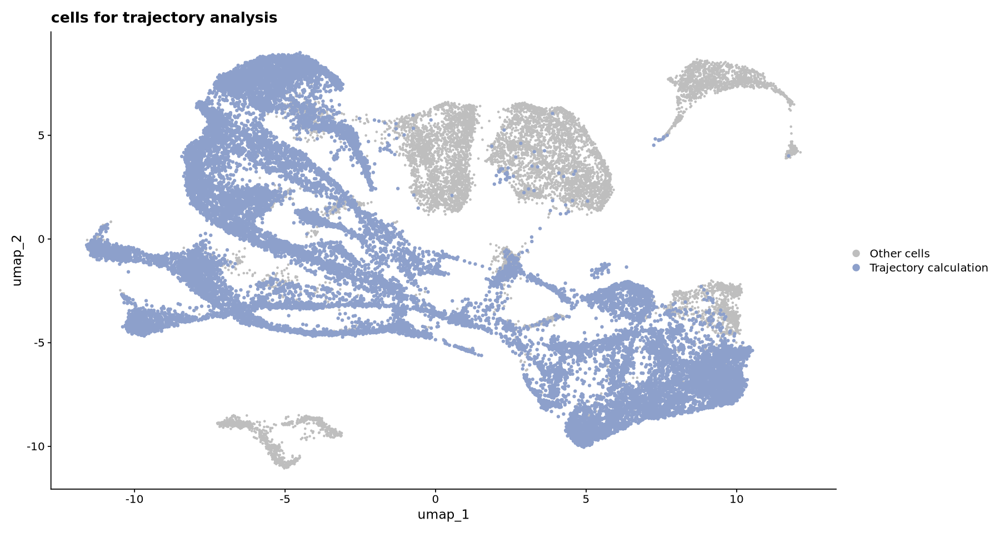

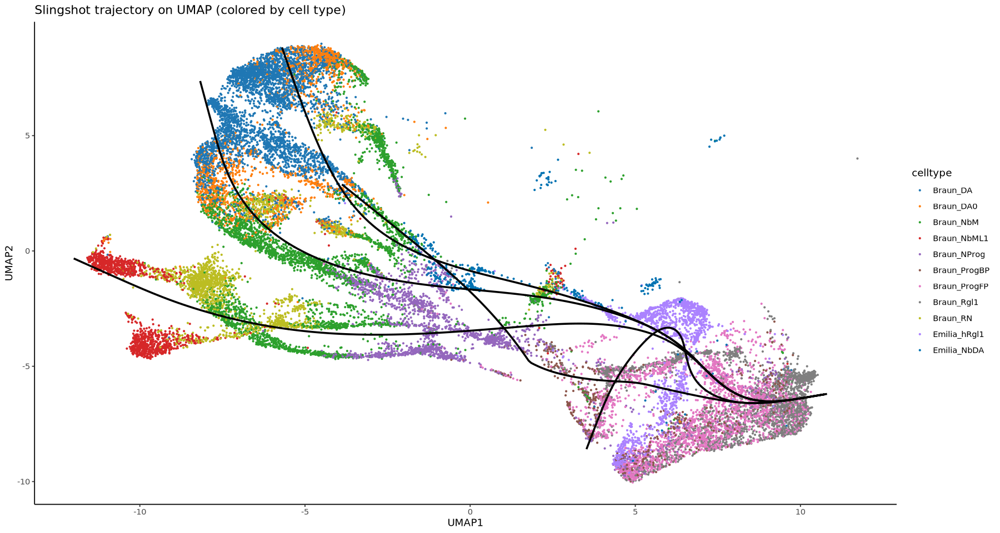

In [253]:
pdim(7,5)
p1_emilia_highlight

p2_intobj_emilia


pdim(9,5)
p3_intobj_braun

pdim(15,8)
p4_traj_cell

p_traj

In [273]:
# Define cell groups
emilia_rgl1 <- rownames(seu_sub@meta.data)[seu_sub@meta.data$Int_celltype %in% c("Emilia_hRgl1", "Emilia_NbDA")]
emilia_da <- rownames(seu_sub@meta.data)[seu_sub@meta.data$Int_celltype %in% c("Emilia_NbDA")]
emilia_cells<-list(hRgl1 = emilia_rgl1, NbDA = emilia_da)

braun_rgl1 <- rownames(seu_sub@meta.data)[seu_sub@meta.data$Int_celltype %in% c("Braun_Rgl1")]
braun_da0 <- rownames(seu_sub@meta.data)[seu_sub@meta.data$Int_celltype %in% c("Braun_DA0")]
braun_da <- rownames(seu_sub@meta.data)[seu_sub@meta.data$Int_celltype %in% c("Braun_DA")]
braun_cells<-list(Rgl1 = braun_rgl1, DA0 = braun_da0, DA = braun_da)

# Plot with multiple highlights and custom colors
p_ad1_emilia <- DimPlot(seu_sub, reduction = "umap", pt.size = 0.5,
                      cells.highlight = emilia_cells) +
  scale_color_manual(
    values = c("grey", "#0072B2", "#AB82FF"),  # grey for others, then colors for Emilia and Braun
    labels = c("Other cells", "NbDA", "hRgl1")
  ) +
  ggtitle("Trajectory cells EA data highlight")

# Plot with multiple highlights and custom colors
p_ad2_braun <- DimPlot(seu_sub, reduction = "umap", pt.size = 0.5,
                      cells.highlight = braun_cells) +
  scale_color_manual(
    values = c("grey", "#AB82FF", "#fc8d62", "#0072B2"),  # grey for others, then colors for Emilia and Braun
    labels = c("Other cells", "Rgl1", "DA0", "DA")
  ) +
  ggtitle("Trajectory cells Braun data rgl1 and DA highlight")


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


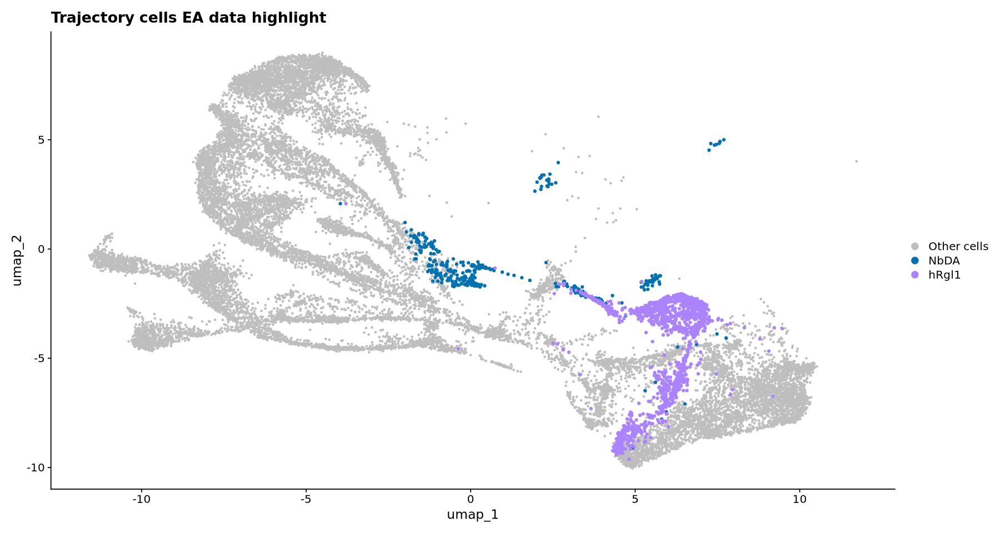

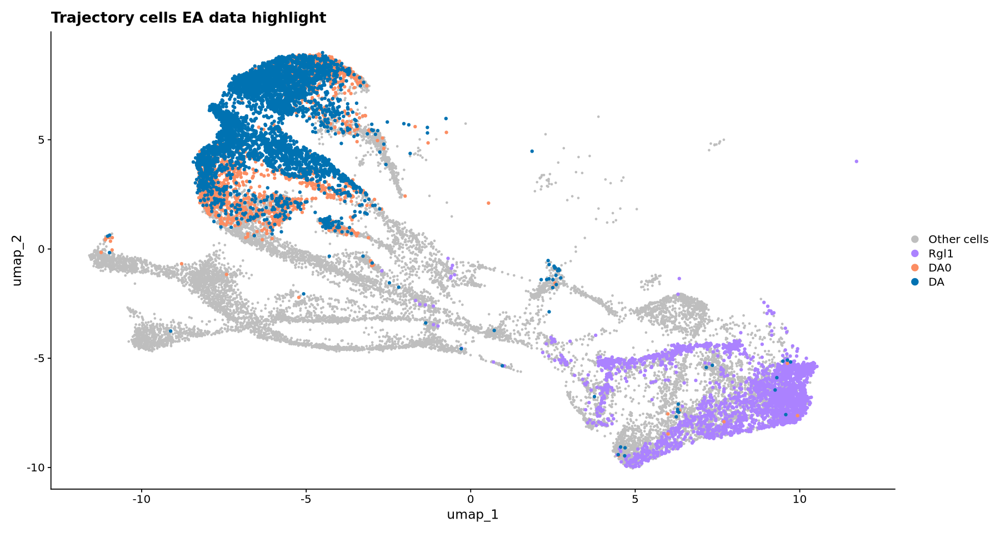

In [272]:
p_ad1_emilia
p_ad2_braun

In [280]:
braun_rgl1 <- rownames(seu_sub@meta.data)[seu_sub@meta.data$Int_celltype %in% c("Braun_Rgl1")]
braun_nbm <- rownames(seu_sub@meta.data)[seu_sub@meta.data$Int_celltype %in% c("Braun_NbM")]
braun_cells<-list(Rgl1 = braun_rgl1, nbm = braun_nbm)

# Plot with multiple highlights and custom colors
p_ad3_braun <- DimPlot(seu_sub, reduction = "umap", pt.size = 0.5,
                      cells.highlight = braun_cells) +
  scale_color_manual(
    values = c("grey", "#AB82FF", "#66c2a5"),  # grey for others, then colors for Emilia and Braun
    labels = c("Other cells", "Rgl1", "NbM")
  ) +
  ggtitle("Trajectory cells Braun data rgl1 and NbM highlight")

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


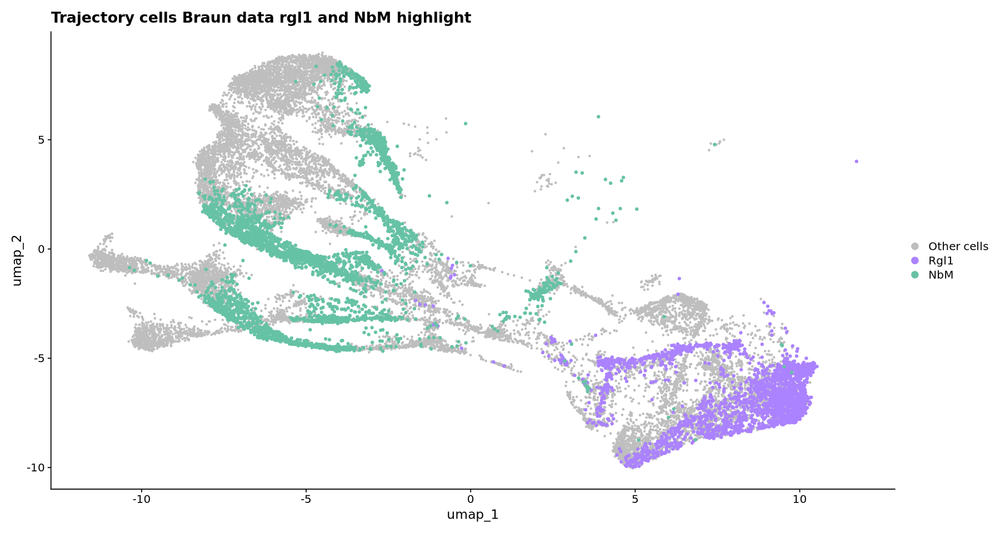

In [281]:
p_ad3_braun

In [277]:
sessionInfo()

R version 4.4.3 (2025-02-28)
Platform: x86_64-conda-linux-gnu
Running under: AlmaLinux 8.10 (Cerulean Leopard)

Matrix products: default
BLAS/LAPACK: /home/ting/miniconda3/envs/seu5_int/lib/libopenblasp-r0.3.30.so;  LAPACK version 3.12.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: Europe/Stockholm
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] RColorBrewer_1.1-3          future_1.58.0              
 [3] tradeSeq_1.20.0             mgcv_1.9-3                 
 [5] nlme_3.1-168                tidyr_1.3.1                
 [7] dplyr_1.1.4  